<a href="https://colab.research.google.com/github/zongcai66/G10_currency_risk_for_Swiss_residents/blob/main/notebooks/interactive_google_colab_app.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

⬆️ *Click on the "Open in Colab" button to visualize all plots in the browser.*

# **Which of the G10 currencies is the riskiest to hold for a Swiss resident?**

In [7]:
#@title Load packages
#### check python version
expected_version = ['Python 3.10.12']
current_version = !python --version

if expected_version != current_version:
    print(f"Version mismatch: This code was written for {expected_version[0]} but is running on Python {current_version[0]}")
else:
    print(f"Python version matches: {expected_version[0]}")


%reset -f
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import requests
from io import StringIO
import os
from datetime import datetime
from dateutil.relativedelta import relativedelta
import plotly.express as px
import yfinance as yf

#
start_date = '2000-01-01'
end_date = datetime.now().strftime('%Y-%m-%d')

Version mismatch: This code was written for Python 3.10.12 but is running on Python Python 3.13.0


In [8]:
#@title Load data
import pandas as pd
import ipywidgets as widgets
from IPython.display import display


df1_FX = pd.read_csv("https://raw.githubusercontent.com/zongcai66/G10_currency_risk_for_Swiss_residents/refs/heads/main/data/raw/yahoo_FX.csv")
df_FX = df1_FX

df1_int = pd.read_csv("https://raw.githubusercontent.com/zongcai66/G10_currency_risk_for_Swiss_residents/main/data/raw/interest_rates.csv")
df_int = df1_int

# Define button actions
def set_df1(_):
    #### interest rates ########################################################
    global df_int
    df_int = df1_int
    #### FX index ##############################################################
    global df_FX
    df_FX = df1_FX
    button_df1.style.button_color = 'lightblue'  # Highlight df1 button
    button_df2.style.button_color = None  # Remove highlight from df2

def set_df2(_):
    #### interest rates ########################################################
    global df_int
    df2_exist = 'df2_int' not in globals()
    global df2_int

    if df2_exist:
        #### FRED data
        urls = {
            "Norway": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01NOM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "Japan": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01JPM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "UK": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01GBM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "United States": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=on&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01USM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "Germany": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01DEM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "Australia": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01AUM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "New Zealand": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01NZM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}',
            "Canada": f'https://fred.stlouisfed.org/graph/fredgraph.csv?bgcolor=%23e1e9f0&chart_type=line&drp=0&fo=open%20sans&graph_bgcolor=%23ffffff&height=450&mode=fred&recession_bars=off&txtcolor=%23444444&ts=12&tts=12&width=1320&nt=0&thu=0&trc=0&show_legend=yes&show_axis_titles=yes&show_tooltip=yes&id=IRSTCI01CAM156N&scale=left&cosd={start_date}&coed={end_date}&line_color=%234572a7&link_values=false&line_style=solid&mark_type=none&mw=3&lw=3&ost=-99999&oet=99999&mma=0&fml=a&fq=Monthly&fam=avg&fgst=lin&fgsnd=2020-02-01&line_index=1&transformation=lin&vintage_date={end_date}&revision_date={end_date}&nd={start_date}'
        }

        # Create an empty DataFrame to store all data
        df_main = pd.DataFrame()

        # Loop through the dictionary and download the data
        for country, url in urls.items():
            response = requests.get(url)
            response.raise_for_status()  # Ensure we notice bad responses

            # Read the CSV data into a temporary DataFrame
            country_data = pd.read_csv(StringIO(response.text), delimiter=',')

            # Rename the last column to 'overnight_rate'
            country_data = country_data.rename(columns={country_data.columns[-1]: 'overnight_rate_pa',
                                                        'DATE': 'date'})

            # Add a column to identify the country
            country_data['country'] = country

            # Append to the main DataFrame
            df_main = pd.concat([df_main, country_data], ignore_index=True)


        #### SNB data
        # Define file names
        data_file = "devkua.csv"

        # Download data
        data_url = f"https://data.snb.ch/api/cube/zimoma/data/csv/en?fromDate={start_date[:7]}&toDate={end_date[:7]}"

        # Fetch and save data
        with requests.get(data_url) as r:
            with open(data_file, 'wb') as f:
                f.write(r.content)

        # Load the data into a DataFrame
        df_swi = pd.read_csv(data_file, skiprows=3, sep=";")
        # delete temp file
        if os.path.isfile(data_file):
            os.remove(data_file)

        # data transformation
        df_swi['Date'] = pd.to_datetime(df_swi['Date'], format='%Y-%m').dt.strftime('%Y-%m-%d')
        df_swi.rename(columns={'Date': 'date', 'Value': 'overnight_rate_pa'}, inplace=True)

        df_swi = df_swi[df_swi['D0'] == 'SARON'] #df_swi = df_swi[df_swi['D0'] == '1TGT']
        df_swi['country'] = 'Switzerland'
        df_swi = df_swi[['date', 'overnight_rate_pa', 'country']]


        #### Risk bank data
        # URL of the Excel file
        url = f'https://www.riksbank.se/en-gb/statistics/interest-rates-and-exchange-rates/search-interest-rates-and-exchange-rates/?a=M&c=Ultimo&from={start_date}&fs=3&s=g2-SECBREPOEFF&to={end_date}&d=Comma&export=csv'

        # Fetch the content of the file
        response = requests.get(url)
        response.raise_for_status()  # Ensure we notice bad responses

        # Load the Excel file directly into a pandas DataFrame
        df_swe = pd.read_csv(StringIO(response.text), delimiter=';')

        df_swe.rename(columns={df_swe.columns[0]: 'date'}, inplace=True)
        df_swe.rename(columns={df_swe.columns[-1]: 'overnight_rate_pa'}, inplace=True)
        df_swe['date'] = pd.to_datetime(df_swe['date'], format='%Y %B').dt.strftime('%Y-%m-%d')
        df_swe['overnight_rate_pa'] = df_swe['overnight_rate_pa'].str.replace(',', '.', regex=False)
        df_swe['overnight_rate_pa'] = pd.to_numeric(df_swe['overnight_rate_pa'], errors='coerce')
        df_swe = df_swe[['date', 'overnight_rate_pa']]
        df_swe['country'] = 'Sweden'


        #### combine
        df2_int = pd.concat([df_main, df_swi, df_swe], ignore_index=True)
        globals()["df2_int"] = df2_int

    df_int = df2_int

    #### FX index ##############################################################
    global df_FX
    df2_exist = 'df2_FX' not in globals()
    global df2_FX

    if df2_exist:
        g10_chf_tickers = [
          "EURCHF=X",  # Euro
          "GBPCHF=X",  # British Pound
          "USDCHF=X",  # US Dollar
          "CADCHF=X",  # Canadian Dollar
          "SEKCHF=X",  # Swedish Krona
          "JPYCHF=X",   # Japanese Yen
          "AUDCHF=X",  # Australian Dollar
          "NZDCHF=X",  # New Zealand Dollar
          "NOKCHF=X"   # Norwegian Krone
      ]

        # Download the data
        df = yf.download(g10_chf_tickers, start=start_date, end=end_date, progress=False)

        df2_FX = df.stack(['Ticker', 'Price'], future_stack=True).reset_index()
        df2_FX.rename(columns={'Date': 'date', 'Ticker': 'ticker', 'Price': 'type', 0: 'value'}, inplace=True)
        df2_FX['date'] = df2_FX['date'].dt.strftime('%Y-%m-%d')
        df2_FX['ticker'] = df2_FX['ticker'].str.replace('=X', '')
        df2_FX = df2_FX.dropna(subset=['value'])

    df_FX = df2_FX

    button_df1.style.button_color = None  # Remove highlight from df1
    button_df2.style.button_color = 'lightblue'  # Highlight df2 button

# Create buttons
str_start = datetime.strptime(start_date, '%Y-%m-%d').strftime('%b %Y')
str_end = (datetime.strptime(end_date, '%Y-%m-%d') - relativedelta(months=1)).strftime('%b %Y')
button_df1 = widgets.Button(description="Github (Jan 2000 to Oct 2024)", layout=widgets.Layout(width='300px', height='50px'))
button_df2 = widgets.Button(description=f"Real time data ({str_start} to {str_end})", layout=widgets.Layout(width='300px', height='50px'))

# Initially highlight the df1 button
button_df1.style.button_color = 'lightblue'

# Assign actions to buttons
button_df1.on_click(set_df1)
button_df2.on_click(set_df2)

# Display buttons
label1 = widgets.HTML(value="<b>Choose the data source:</b>")
label2 = widgets.HTML(value="(default is data from Github repository)")
display(label1, button_df1, button_df2, label2)

#### define consitent color scheme #############################################
# Use a built-in Plotly palette (e.g., Viridis)
custom_colors = px.colors.qualitative.Plotly  # Other options: D3, Set2, Pastel1, etc.
countries = ['Switzerland', 'Australia', 'Canada', 'Germany', 'UK', 'Japan', 'New Zealand', 'Sweden', 'United States', 'Norway']
tickers = ['CHF', 'AUDCHF', 'CADCHF', 'EURCHF', 'GBPCHF', 'JPYCHF', 'NZDCHF', 'SEKCHF', 'USDCHF', 'NOKCHF']

# Create a dictionary to map countries and tickers to colors
color_mapping = {country: color for country, color in zip(countries, custom_colors)}
ticker_to_country = dict(zip(tickers, countries))

HTML(value='<b>Choose the data source:</b>')

Button(description='Github (Jan 2000 to Oct 2024)', layout=Layout(height='50px', width='300px'), style=ButtonS…

Button(description='Real time data (Jan 2000 to Nov 2024)', layout=Layout(height='50px', width='300px'), style…

HTML(value='(default is data from Github repository)')

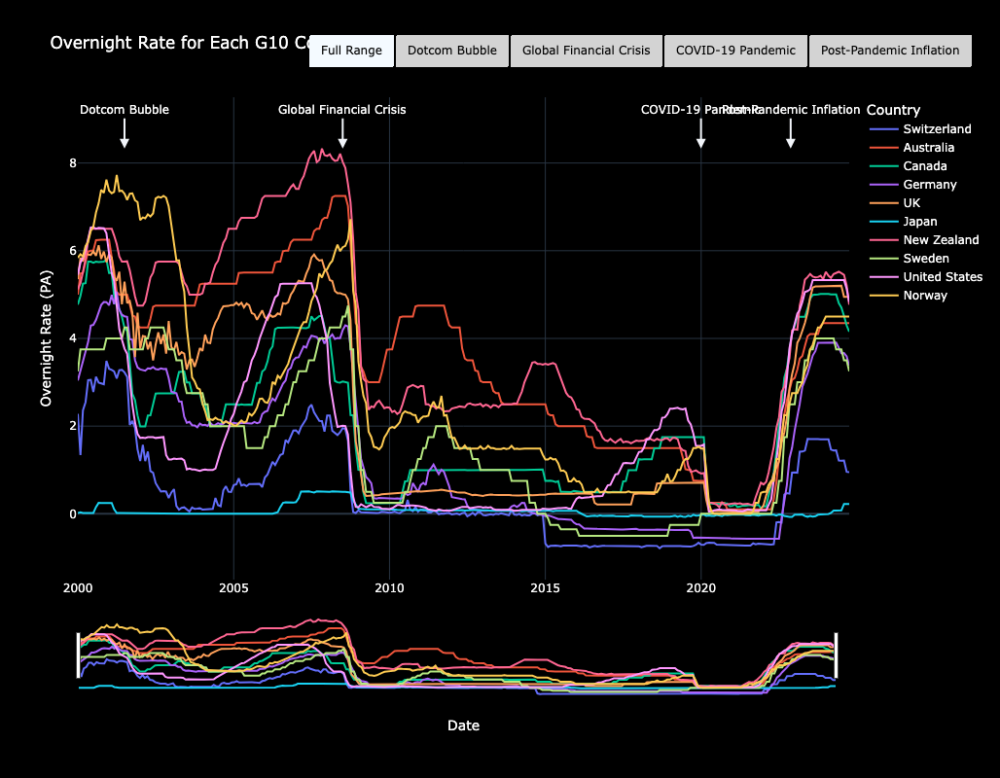

In [4]:
#@title Overview: Interest rates
fig = go.Figure()

# Add traces for each country in the specified order
for country in countries:
    if country in df_int['country'].unique():  # Ensure the country exists in the data
        country_data = df_int[df_int['country'] == country]
        fig.add_trace(go.Scatter(
            x=country_data['date'],
            y=country_data['overnight_rate_pa'],
            mode='lines',
            name=country,
            line=dict(color=color_mapping.get(country, 'grey')),  # Use 'grey' as fallback
            visible=True  # All traces visible initially
        ))

# Define event ranges and annotations
events = {
    "Full Range": (df_int['date'].min(), df_int['date'].max()),
    "Dotcom Bubble": ("2000-01-01", "2002-12-31"),
    "Global Financial Crisis": ("2007-01-01", "2009-12-31"),
    "COVID-19 Pandemic": ("2019-06-30", "2020-06-30"),
    "Post-Pandemic Inflation": ("2021-10-01", "2023-12-31")
}

annotations = [
    dict(
        x=(pd.to_datetime(start) + (pd.to_datetime(end) - pd.to_datetime(start)) / 2).strftime("%Y-%m-%d"),
        y=df_int['overnight_rate_pa'].max(),  # Place annotations near the top
        text=event,
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        ax=0,
        ay=-40
    )
    for event, (start, end) in events.items() if event != "Full Range"
]

# Add buttons for each event
buttons = [
    dict(
        label=event,
        method="relayout",
        args=[{
            "xaxis.range": [start, end]
        }]
    )
    for event, (start, end) in events.items()
]

# Update layout for enhancements
fig.update_layout(
    title="Overnight Rate for Each G10 Country",
    xaxis=dict(
        title="Date",
        rangeslider=dict(visible=True),
        type="date",
        range=[df_int['date'].min(), df_int['date'].max()]
    ),
    yaxis=dict(
        title="Overnight Rate (PA)",
        range=[-1.5, 9.5]
    ),
    legend_title="Country",
    template="plotly_dark",
    hovermode="x unified",
    plot_bgcolor="black",
    paper_bgcolor="black",
    font=dict(color="white"),
    width=1600,
    height=800,
    updatemenus=[
        dict(
            type="buttons",
            showactive=True,
            buttons=buttons,
            direction="left",
            x=0.3,
            y=1.15,
            xanchor="left",
            yanchor="top",
            pad={"r": 10, "t": 10},
            bgcolor="lightgrey",
            font=dict(color="black")
        )],
    annotations=annotations
)

fig.show()


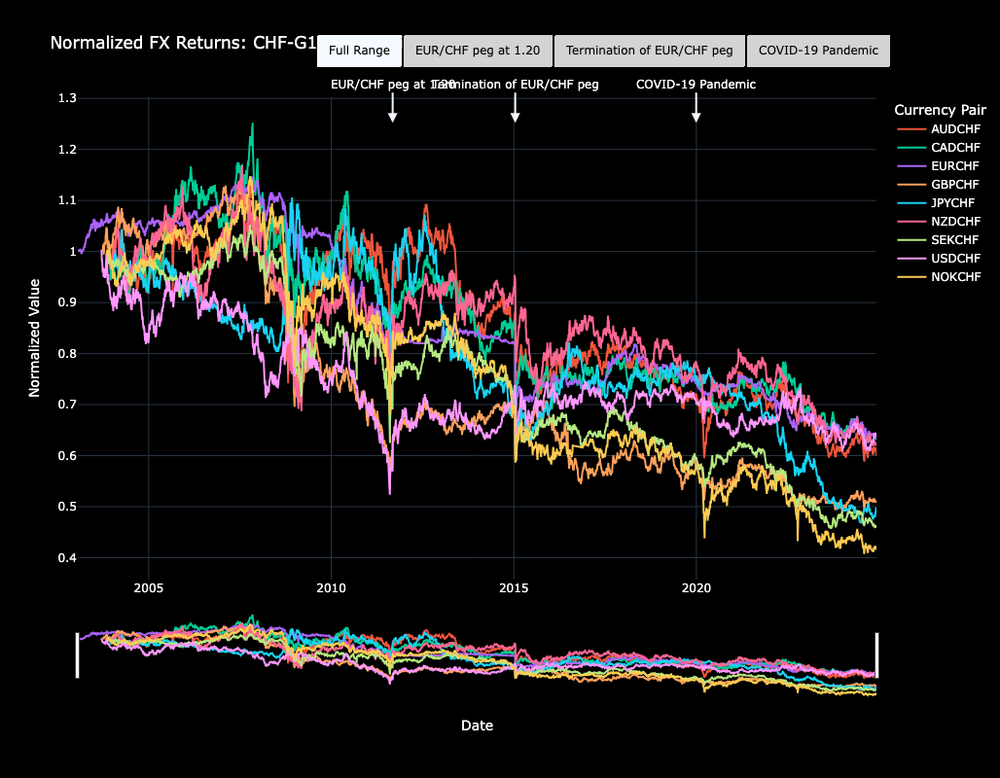

In [5]:
#@title Overview: IFX rate

# Create the figure using normalized values
fig = go.Figure()

# Filter for 'Adj Close' type and drop rows with missing 'value'
df_adj_close = df_FX[df_FX['type'] == 'Adj Close'].dropna(subset=['value'])

# Normalize the 'value' column by the first value for each ticker
df_adj_close['normalized_value'] = df_adj_close.groupby('ticker', group_keys=False)['value'].apply(lambda x: x / x.iloc[0])

# Exclude rows with normalized values below 0.01 (likely errors)
df_adj_close = df_adj_close[~(df_adj_close['normalized_value'] < 0.01)]

# Add a line trace for each currency pair
for ticker in tickers:
    ticker_data = df_adj_close[df_adj_close['ticker'] == ticker]
    fig.add_trace(go.Scatter(
        x=ticker_data['date'],
        y=ticker_data['normalized_value'],
        mode='lines',
        name=ticker,
        line=dict(color=color_mapping[ticker_to_country[ticker]])
    ))

# Define event ranges and annotations
events = {
    "Full Range": (df_adj_close['date'].min(), df_adj_close['date'].max()),
    "EUR/CHF peg at 1.20": ("2011-07-01", "2011-11-15"),
    "Termination of EUR/CHF peg": ("2014-11-01", "2015-3-31"),
    "COVID-19 Pandemic": ("2019-06-30", "2020-06-30")
}

annotations = [
    dict(
        x=(pd.to_datetime(start) + (pd.to_datetime(end) - pd.to_datetime(start)) / 2).strftime("%Y-%m-%d"),
        y=df_adj_close['normalized_value'].max(),  # Place annotations near the top
        text=event,
        showarrow=True,
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        ax=0,
        ay=-40
    )
    for event, (start, end) in events.items() if event != "Full Range"
]

# Add buttons for event zooming
buttons = [
    dict(
        label=event,
        method="relayout",
        args=[{
            "xaxis.range": [start, end]
        }]
    )
    for event, (start, end) in events.items()
]

# Update layout for enhancements
fig.update_layout(
    title="Normalized FX Returns: CHF-G10 Currencies",
    xaxis=dict(
        title="Date",
        rangeslider=dict(visible=True),
        type="date",
        range=[df_adj_close['date'].min(), df_adj_close['date'].max()]
    ),
    yaxis=dict(
        title="Normalized Value",
        range=[df_adj_close['normalized_value'].min() - 0.05, df_adj_close['normalized_value'].max() + 0.05]
    ),
    legend_title="Currency Pair",
    template="plotly_dark",
    hovermode="x unified",
    plot_bgcolor="black",
    paper_bgcolor="black",
    font=dict(color="white"),
    width=1600,
    height=800,
    updatemenus=[
        dict(
            type="buttons",
            showactive=True,
            buttons=buttons,
            direction="left",
            x=0.3,
            y=1.15,
            xanchor="left",
            yanchor="top",
            pad={"r": 10, "t": 10},
            bgcolor="lightgrey",
            font=dict(color="black")
        )],
    annotations=annotations
)

fig.show()


In [ ]:
#@title Select time horizon
import pandas as pd
import ipywidgets as widgets
from ipywidgets import interactive
import matplotlib.pyplot as plt

#### beta calculations
# Load the data
url = "https://raw.githubusercontent.com/zongcai66/G10_currency_risk_for_Swiss_residents/refs/heads/main/data/modeling_data/merged_FX_Interest_logreturns.csv"
df_OG = pd.read_csv(url)

# Convert the 'date' column to datetime
df_OG['date'] = pd.to_datetime(df_OG['date'])
df_beta = df_OG.copy()
# Get the minimum and maximum date for the range
min_date = df_OG['date'].min()
max_date = df_OG['date'].max()

# Create a list of month-year labels between the min_date and max_date
month_year_range = pd.date_range(min_date, max_date, freq='MS')  # Monthly frequency, starting at the start of the month
month_year_labels = [date.strftime('%Y') for date in month_year_range]  # Format as "Month Year"

# Function to convert a month-year label to the corresponding datetime object
def label_to_date(label):
    return pd.to_datetime(label, format='%Y')

# Create interactive widgets for filtering using a range slider
def filter_data(date_range):
    # Extract start and end labels from the slider value
    start_label, end_label = date_range
    # Convert the labels to dates
    start_date = label_to_date(start_label)
    end_date = label_to_date(end_label)

    # Apply filtering to the dataframe
    filtered_df = df_OG[(df_OG['date'] >= start_date) & (df_OG['date'] <= end_date)]

    # Show the filtered data
    globals()['df_beta'] = filtered_df

# Set up the interactive widget with a range slider
interactive_plot = interactive(
    filter_data,
    date_range=widgets.SelectionRangeSlider(
        options=month_year_labels,
        value=(month_year_labels[0], month_year_labels[-1]),
        description='Year time horizon',
        continuous_update=False,
        layout=widgets.Layout(width='50%'),  # Make the slider longer
        style={'description_width': 'initial'}  # Ensure label is visible
    )
)


#### VaR And ES calculations
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

df = df_FX[df_FX['type'] == 'Adj Close'].dropna(subset=['value'])
df['normalized_value'] = df.groupby('ticker', group_keys=False)['value'].apply(lambda x: x / x.iloc[0])
df = df[~(df['normalized_value'] < 0.01)]
df.loc[:, 'date'] = pd.to_datetime(df['date'])  # Ensure 'date' is in datetime format
df = df.sort_values(by=['ticker', 'date'])

# Function to calculate returns at different frequencies
def calculate_returns(df, freq='D'):
    df = df.set_index('date')  # Ensure 'date' is the index for resampling
    return df.groupby('ticker')['normalized_value'].resample(freq).last().pct_change().dropna()

# Frequencies and alpha levels to be used
freq_list = ['D', 'M', 'Q', '2A', 'A']  # Daily, Monthly, Quarterly, Semi-Annually, Annually
alpha_list = [2.5, 5, 7.5]  # VaR levels at 2.5%, 5%, and 7.5%

# Initialize an empty DataFrame to store the results
results = pd.DataFrame(columns=['Frequency', 'Alpha', 'Ticker', 'Std', 'VaR', 'ES'])

# Loop through each frequency and alpha level
for freq in freq_list:
    df_returns = calculate_returns(df, freq=freq)
    tickers = df_returns.index.get_level_values('ticker').unique()

    for alpha in alpha_list:
        for ticker in tickers:
            # Filter data for the current ticker
            ticker_data = df_returns[df_returns.index.get_level_values('ticker') == ticker]
            # Calculate standard deviation (volatility)
            std = ticker_data.std()
            # Calculate Value at Risk at the given alpha level
            VaR = np.percentile(ticker_data, alpha)
            # Calculate Expected Shortfall (ES) at the given alpha level
            ES = ticker_data[ticker_data <= VaR].mean()
            # Create a DataFrame with the current result
            result_row = pd.DataFrame({
                'Frequency': [freq],
                'Alpha': [alpha],
                'Ticker': [ticker],
                'Std': [std],
                'VaR': [VaR],
                'ES': [ES]
            })
            # Concatenate the result with the existing results DataFrame
            results = pd.concat([results, result_row], ignore_index=True)

# Display the results
df1 = results[results['Alpha']==2.5]
df2 = results[results['Alpha']==5]
df3 = results[results['Alpha']==7.5]


#### filter bar
interactive_plot

interactive(children=(SelectionRangeSlider(continuous_update=False, description='Year time horizon', index=(0,…

In [6]:
#@title Robustness test: Regression
import pandas as pd
import plotly.graph_objects as go
import statsmodels.api as sm
import plotly.express as px
import numpy as np

# List of countries and tickers as provided
custom_colors = px.colors.qualitative.Plotly  # Available color scales: D3, Set2, etc.
countries = ['Switzerland', 'Australia', 'Canada', 'Germany', 'UK', 'Japan', 'New Zealand', 'Sweden', 'United States', 'Norway']
tickers = ['CHF', 'AUDCHF', 'CADCHF', 'EURCHF', 'GBPCHF', 'JPYCHF', 'NZDCHF', 'SEKCHF', 'USDCHF', 'NOKCHF']

# Create a dictionary to map countries to colors
color_mapping = {country: color for country, color in zip(countries, custom_colors)}

# Map tickers to countries
ticker_to_country = dict(zip(tickers, countries))

# Extract the unique countries from the dataset
countries = df_beta['country'].unique()

# Initialize the figure
fig = go.Figure()

# Prepare a dictionary to store regression lines for each country
regression_lines = {}

# Loop through each country and perform regression, adding the country data and regression line
for country in countries:
    country_data = df_beta[df_beta['country'] == country]

    # Set the dependent and independent variables
    y = country_data['log_return']
    X = country_data['interest_rate_log_diff']

    # Add constant term for the intercept
    X = sm.add_constant(X)

    # Perform OLS regression
    model = sm.OLS(y, X).fit()

    # Get the regression parameters (intercept and slope)
    intercept, slope = model.params

    # Extrapolate the regression line: extend the x values beyond the data range
    x_extrapolated = np.linspace(-0.08, 0.04, 100)  # Fixed x-range for extrapolation
    y_extrapolated = intercept + slope * x_extrapolated

    # Color for the country from the color mapping
    color = color_mapping.get(country, 'grey')  # Default to grey if country is not in the mapping

    # Add scatter plot for the data points of the country
    fig.add_trace(go.Scatter(
        x=country_data['interest_rate_log_diff'],
        y=country_data['log_return'],
        mode='markers',
        name=f'{country} Data',
        marker=dict(size=6, color=color),
        visible=True,  # Initially visible
        showlegend=False  # Hide data points from the legend
    ))

    # Add regression line for the country (extrapolated) with the same color
    fig.add_trace(go.Scatter(
        x=x_extrapolated,
        y=y_extrapolated,
        mode='lines',
        name=f'{country} Regression Line',
        line=dict(color=color, width=2),
        visible=True,  # Initially visible
        showlegend=True  # Show regression line in the legend
    ))

# Dropdown menu to select country
buttons = [
    dict(
        label="Show All",
        method="update",
        args=[{"visible": [True] * len(countries) * 2}, {"title": "Regression for All Countries"}]
    )
]

for i, country in enumerate(countries):
    buttons.append(
        dict(
            label=country,
            method="update",
            args=[{
                "visible": [
                    j == i * 2 or j == i * 2 + 1  # Only show selected country data and regression line
                    for j in range(len(countries) * 2)
                ]
            }, {"title": f"Regression for {country}"}]
        )
    )

# Fixed y axis range to ensure consistent scaling across all plots
y_range = [df_beta['log_return'].min() - 0.1, df_beta['log_return'].max() + 0.1]

# Update layout for the plot
fig.update_layout(
    title="Regression for Each Country",
    xaxis=dict(
        title="Interest Rate Log Difference",
        type="linear",
        range=[-0.08, 0.04],  # Fixed x-range
    ),
    yaxis=dict(
        title="Log Return",
        type="linear",
        range=y_range  # Fixed range for y-axis
    ),
    updatemenus=[dict(
        type="buttons",
        showactive=True,
        buttons=buttons,
        direction="left",
        x=0.3,
        y=1.15,
        xanchor="left",
        yanchor="top",
        pad={"r": 10, "t": 10},
        bgcolor="lightgrey",
        font=dict(color="black")
    )],
    template="plotly_dark",
    plot_bgcolor="black",
    paper_bgcolor="black",
    font=dict(color="white"),
    width=1600,
    height=800,
    legend=dict(
        orientation="h",  # Horizontal legend
        yanchor="bottom",  # Align the legend to the bottom
        y=-0.2,  # Move the legend below the plot
        xanchor="center",  # Center the legend
        x=0.5  # Center the legend horizontally
    )
)

# Show the plot
fig.show()


NameError: name 'df_beta' is not defined

In [ ]:
#@title Robustness test: Value-at-risk

# Mapping for frequency labels
freq_labels = {
    'D': 'Daily',
    'M': 'Monthly',
    'Q': 'Quarterly',
    '2A': 'Semi-Annually',
    'A': 'Annually'
}

# Create figure
fig = go.Figure()

df = results
# Define frequencies and alphas
freqs = ['D', 'M', 'Q', '2A', 'A']
alphas = [2.5, 5, 7.5]

# Function to get color for a ticker
def get_color(ticker):
    country = ticker_to_country.get(ticker, 'Switzerland')
    return color_mapping.get(country, '#636EFA')

# Add initial traces for all frequencies and the default alpha (2.5)
for freq in freqs:
    filtered_df = df[(df['Frequency'] == freq) & (df['Alpha'] == 2.5)]
    fig.add_trace(
        go.Bar(
            x=filtered_df['Ticker'],
            y=filtered_df['VaR'],
            marker=dict(color=[get_color(ticker) for ticker in filtered_df['Ticker']]),
            name=freq_labels[freq],  # Use descriptive labels
            visible=(freq == 'D')  # Make 'D' (Daily) visible by default
        )
    )

# Frequency slider steps
freq_steps = [
    dict(
        label=freq_labels[freq],  # Use descriptive labels in the slider
        method="update",
        args=[
            {"visible": [freq == f for f in freqs]},  # Set visibility for each trace
            {"title": f"VaR Bar Plot"}
        ]
    )
    for freq in freqs
]

# Alpha buttons
alpha_buttons = [
    dict(
        label=f"Alpha {alpha}",
        method="update",
        args=[
            {
                "x": [df[(df['Frequency'] == freq) & (df['Alpha'] == alpha)]['Ticker'] for freq in freqs],
                "y": [df[(df['Frequency'] == freq) & (df['Alpha'] == alpha)]['VaR'] for freq in freqs],
                "marker.color": [
                    [get_color(ticker) for ticker in df[(df['Frequency'] == freq) & (df['Alpha'] == alpha)]['Ticker']]
                    for freq in freqs
                ]
            },
            {"title": f"VaR Bar Plot"}
        ]
    )
    for alpha in alphas
]

# Update layout with fixed axis ranges and styling
fig.update_layout(
    title="VaR Bar Plot",
    xaxis=dict(
        title="Ticker",
        tickmode="array",
        tickvals=sorted(df['Ticker'].unique()),  # Ensure all tickers are shown on x-axis
        range=[-0.5, len(df['Ticker'].unique()) - 0.5],  # Set fixed x-axis range
        rangeslider=dict(visible=False),  # No rangeslider for bar plot
        type="category"
    ),
    yaxis=dict(
        title="VaR (%)",  # Updated title to indicate percentage
        range=[df['VaR'].min() - 0.02, df['VaR'].max()],  # Set fixed y-axis range
        tickformat=".0%"  # Format y-axis labels as rounded percentages
    ),
    legend_title="Frequency",
    template="plotly_dark",
    hovermode="x unified",
    plot_bgcolor="black",
    paper_bgcolor="black",
    font=dict(color="white"),
    width=1600,
    height=800,
    updatemenus=[
        dict(
            type="buttons",
            showactive=True,
            buttons=alpha_buttons,
            direction="left",
            x=0.3,
            y=1.15,
            xanchor="left",
            yanchor="top",
            pad={"r": 10, "t": 10},
            bgcolor="lightgrey",
            font=dict(color="black")
        )
    ],
    sliders=[
        dict(
            active=0,
            currentvalue={"prefix": "Return frequency: "},
            pad={"t": 50},
            steps=freq_steps
        )
    ]
)


fig.show()


In [ ]:
#@title Robustness test: Expected shortfall

# Mapping for frequency labels
freq_labels = {
    'D': 'Daily',
    'M': 'Monthly',
    'Q': 'Quarterly',
    '2A': 'Semi-Annually',
    'A': 'Annually'
}

# Create figure
fig = go.Figure()

df = results
# Define frequencies and alphas
freqs = ['D', 'M', 'Q', '2A', 'A']
alphas = [2.5, 5, 7.5]

# Function to get color for a ticker
def get_color(ticker):
    country = ticker_to_country.get(ticker, 'Switzerland')
    return color_mapping.get(country, '#636EFA')

# Add initial traces for all frequencies and the default alpha (2.5)
for freq in freqs:
    filtered_df = df[(df['Frequency'] == freq) & (df['Alpha'] == 2.5)]
    fig.add_trace(
        go.Bar(
            x=filtered_df['Ticker'],
            y=filtered_df['ES'],  # Updated to ES
            marker=dict(color=[get_color(ticker) for ticker in filtered_df['Ticker']]),
            name=freq_labels[freq],  # Use descriptive labels
            visible=(freq == 'D')  # Make 'D' (Daily) visible by default
        )
    )

# Frequency slider steps
freq_steps = [
    dict(
        label=freq_labels[freq],  # Use descriptive labels in the slider
        method="update",
        args=[
            {"visible": [freq == f for f in freqs]},  # Set visibility for each trace
            {"title": f"ES Bar Plot"}
        ]
    )
    for freq in freqs
]

# Alpha buttons
alpha_buttons = [
    dict(
        label=f"Alpha {alpha}",
        method="update",
        args=[
            {
                "x": [df[(df['Frequency'] == freq) & (df['Alpha'] == alpha)]['Ticker'] for freq in freqs],
                "y": [df[(df['Frequency'] == freq) & (df['Alpha'] == alpha)]['ES'] for freq in freqs],  # Updated to ES
                "marker.color": [
                    [get_color(ticker) for ticker in df[(df['Frequency'] == freq) & (df['Alpha'] == alpha)]['Ticker']]
                    for freq in freqs
                ]
            },
            {"title": f"ES Bar Plot"}
        ]
    )
    for alpha in alphas
]

# Update layout with fixed axis ranges and styling
fig.update_layout(
    title="ES Bar Plot",
    xaxis=dict(
        title="Ticker",
        tickmode="array",
        tickvals=sorted(df['Ticker'].unique()),  # Ensure all tickers are shown on x-axis
        range=[-0.5, len(df['Ticker'].unique()) - 0.5],  # Set fixed x-axis range
        rangeslider=dict(visible=False),  # No rangeslider for bar plot
        type="category"
    ),
    yaxis=dict(
        title="ES (%)",  # Updated title to indicate percentage
        range=[df['ES'].min() - 0.02, df['ES'].max()],  # Set fixed y-axis range
        tickformat=".0%"  # Format y-axis labels as rounded percentages
    ),
    legend_title="Frequency",
    template="plotly_dark",
    hovermode="x unified",
    plot_bgcolor="black",
    paper_bgcolor="black",
    font=dict(color="white"),
    width=1600,
    height=800,
    updatemenus=[
        dict(
            type="buttons",
            showactive=True,
            buttons=alpha_buttons,
            direction="left",
            x=0.3,
            y=1.15,
            xanchor="left",
            yanchor="top",
            pad={"r": 10, "t": 10},
            bgcolor="lightgrey",
            font=dict(color="black")
        )
    ],
    sliders=[
        dict(
            active=0,
            currentvalue={"prefix": "Return frequency: "},
            pad={"t": 50},
            steps=freq_steps
        )
    ]
)


fig.show()
